In [2]:
# 02_indices_vegfrac.py
# Feb 19 2025

'''Description:
This script will load time series Sentinel-2 data for a region/timeframe of interest.
It will calculate a bunch of default indices for the automated analysis of paddock time series data. 
It will also calculate the vegetation fractional cover using Scarth et al method. 
There will also be an option to turn off the veg frac cover calculation. This will save timem, but the results won't be compatible with later scripts. 
There will also be an option to specify additional indices to calculate. 

Inputs:

Outputs:
'''

import numpy as np
import pickle
import xarray as xr
import rioxarray  # activate the rio accessor
import matplotlib.pyplot as plt 
import seaborn as sns
import rasterio
import os
import shutil

# Change the working directory to the desired path
os.chdir('/home/106/jb5097/Projects/PaddockTS')

from Code.indices_etc import *

2025-02-20 15:30:28.162810: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-20 15:30:28.162859: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-20 15:30:28.163964: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
stub = 'TEST5'
out_dir = '/g/data/xe2/John/Data/PadSeg/'

In [4]:
## Open the satellite data stack
with open(out_dir+stub+'_ds2.pkl', 'rb') as handle:
    ds = pickle.load(handle)


In [5]:
## Add veg fractions to ds
band_names = ['nbart_blue', 'nbart_green', 'nbart_red', 'nbart_nir_1', 'nbart_swir_2', 'nbart_swir_3']
i = 4  # or whichever model index you want to use

fractions = calculate_fractional_cover(ds, band_names, i, correction=False)
ds = add_fractional_cover_to_ds(ds, fractions)



SHape of input (should be time, bands, x, y): (10, 6, 205, 194)
Not applying correction factors


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [6]:
import numpy as np
import xarray as xr

def calculate_indices(ds, indices):
    """
    Calculate multiple indices and add them to the dataset as new variables.
    
    Parameters:
        ds (xarray.Dataset): The input xarray dataset with dimensions (time, y, x).
        indices (dict): A dictionary where keys are the names of the indices to be added,
                        and values are functions that calculate the index.
    
    Returns:
        xarray.Dataset: A copy of the dataset with the additional indices added as new variables.
    """
    ds_updated = ds.copy()  # Work on a copy so the original remains unchanged

    for index_name, index_func in indices.items():
        # Calculate the index from the dataset
        index_data = index_func(ds_updated)
        # Add the calculated index as a new variable in the dataset
        ds_updated[index_name] = index_data
        print(f"{index_name} has shape: {index_data.shape}")
    
    return ds_updated

def calculate_ndvi(ds):
    """
    Calculate NDVI (Normalized Difference Vegetation Index) using the red and NIR bands.
    
    NDVI = (NIR - Red) / (NIR + Red)
    """
    red = ds['nbart_red']
    nir = ds['nbart_nir_1']
    ndvi = (nir - red) / (nir + red)
    return ndvi

def calculate_cfi(ds):
    """
    Calculate the Canola Flower Index (CFI).
    
    Based on Tian et al. 2022 Remote Sensing.
    Requires that NDVI is already calculated and present as 'NDVI' in the dataset.
    """
    ndvi = ds['NDVI']  # Assumes NDVI is already available in the dataset
    red = ds['nbart_red']
    green = ds['nbart_green']
    blue = ds['nbart_blue']
    
    sum_red_green = red + green
    diff_green_blue = green - blue
    cfi = ndvi * (sum_red_green + diff_green_blue)
    return cfi

def calculate_nirv(ds):
    """
    Calculate the Near Infrared Reflectance of Vegetation (NIRv).
    
    NIRv = NDVI * NIR
    """
    ndvi = ds['NDVI']  # Again, assumes NDVI has been computed
    nir = ds['nbart_nir_1']
    nirv = ndvi * nir
    return nirv

def calculate_dnirv(ds):
    """
    Calculate the difference in NIRv compared to the previous time step.
    
    Note: This will result in one fewer time step in the output.
    """
    nirv = calculate_nirv(ds)
    dnirv = nirv.diff(dim='time', n=1)
    return dnirv

def calculate_ndti(ds):
    """
    Calculate the Normalized Difference Tillage Index (NDTI).
    
    NDTI = (SWIR1 - SWIR2) / (SWIR1 + SWIR2)
    where SWIR1 and SWIR2 correspond to 'nbart_swir_2' and 'nbart_swir_3' respectively.
    """
    swir1 = ds['nbart_swir_2']
    swir2 = ds['nbart_swir_3']
    ndti = (swir1 - swir2) / (swir1 + swir2)
    return ndti

def calculate_cai(ds):
    """
    Calculate the Cellulose Absorption Index (CAI).
    
    CAI = 0.5 * (SWIR1 + SWIR2) - NIR
    where SWIR1 is 'nbart_swir_2', SWIR2 is 'nbart_swir_3', and NIR is 'nbart_nir_1'.
    """
    swir1 = ds['nbart_swir_2']
    swir2 = ds['nbart_swir_3']
    nir = ds['nbart_nir_1']
    cai = 0.5 * (swir1 + swir2) - nir
    return cai

# Example usage:
# First, calculate NDVI and add it to the dataset.
# ds = ds.assign(NDVI=calculate_ndvi(ds))
#
# Then, define which indices you want to add.
# indices = {
#     'CFI': calculate_cfi,
#     'NIRv': calculate_nirv,
#     'NDTI': calculate_ndti,
#     'CAI': calculate_cai
# }
#
# updated_ds = calculate_indices(ds, indices)
# print(updated_ds)

In [7]:
indices = {
    'NDVI': calculate_ndvi,
    'CFI': calculate_cfi,
    'NIRv': calculate_nirv,
    'dNIRv': calculate_dnirv,
    'NDTI': calculate_ndti,
    'CAI': calculate_cai
}

ds = calculate_indices(ds, indices)
print(ds)

NDVI has shape: (10, 205, 194)
CFI has shape: (10, 205, 194)
NIRv has shape: (10, 205, 194)
dNIRv has shape: (9, 205, 194)
NDTI has shape: (10, 205, 194)
CAI has shape: (10, 205, 194)
<xarray.Dataset>
Dimensions:           (time: 10, y: 205, x: 194)
Coordinates:
  * time              (time) datetime64[ns] 2019-06-25T00:27:29.882900 ... 20...
  * y                 (y) float64 -4.424e+06 -4.424e+06 ... -4.426e+06
  * x                 (x) float64 1.388e+07 1.388e+07 ... 1.388e+07 1.388e+07
    spatial_ref       int32 6933
Data variables: (12/19)
    nbart_blue        (time, y, x) float32 221.0 219.0 217.0 ... 584.0 332.0
    nbart_green       (time, y, x) float32 413.0 441.0 428.0 ... 916.0 560.0
    nbart_red         (time, y, x) float32 579.0 558.0 573.0 ... 1.063e+03 614.0
    nbart_red_edge_1  (time, y, x) float32 861.0 861.0 ... 1.267e+03 1.267e+03
    nbart_red_edge_2  (time, y, x) float32 1.298e+03 1.298e+03 ... 2.395e+03
    nbart_red_edge_3  (time, y, x) float32 1.33e+03 1.33e+0

In [9]:
print("Data variables:", list(ds.data_vars))

Data variables: ['nbart_blue', 'nbart_green', 'nbart_red', 'nbart_red_edge_1', 'nbart_red_edge_2', 'nbart_red_edge_3', 'nbart_nir_1', 'nbart_nir_2', 'nbart_swir_2', 'nbart_swir_3', 'bg', 'pv', 'npv', 'NDVI', 'CFI', 'NIRv', 'dNIRv', 'NDTI', 'CAI']


/g/data/xe2/John/geospatenv/lib/python3.11/site-packages/matplotlib/image.py:463: RuntimeWarning: invalid value encountered in scalar subtract
  newmin = vmid - dv * fact


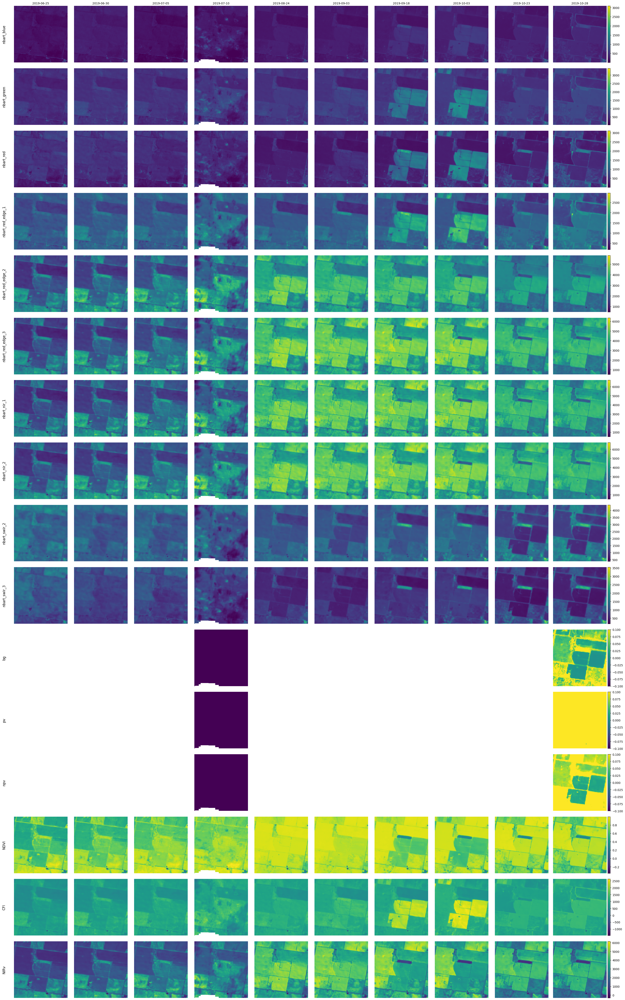

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# List of variables (indices) to plot.
indices = ['NDVI', 'CFI', 'NIRv', 'dNIRv', 'NDTI', 'CAI']
n_indices = len(indices)
n_times = ds.time.size

# Create a grid: rows = variables, columns = time steps.
fig, axes = plt.subplots(n_indices, n_times, 
                         figsize=(3 * n_times, 3 * n_indices), 
                         squeeze=False)

for i, idx in enumerate(indices):
    # Compute the global vmin and vmax for the current variable over all time steps.
    data_all = ds[idx].values  # shape: (time, y, x)
    global_vmin = np.nanmin(data_all)
    global_vmax = np.nanmax(data_all)
    
    # Plot each time step using the same vmin and vmax.
    im_list = []
    for j, t in enumerate(ds.time.values):
        ax = axes[i, j]
        data = ds[idx].sel(time=t).values
        im = ax.imshow(data, cmap='viridis', vmin=global_vmin, vmax=global_vmax)
        ax.axis('off')
        im_list.append(im)
        # For the top row, set a title with the date.
        if i == 0:
            ax.set_title(str(t)[:10], fontsize=10)
    
    # Add a colorbar to the right of the right-most panel in this row.
    ax_last = axes[i, -1]
    divider = make_axes_locatable(ax_last)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    # Use the last image from this row for the colorbar.
    fig.colorbar(im_list[-1], cax=cax)
    
    # Place the variable name to the left of the left-most panel in this row.
    ax_first = axes[i, 0]
    ax_first.text(-0.15, 0.5, idx, transform=ax_first.transAxes,
                  va='center', ha='right', fontsize=12, rotation=90)

plt.tight_layout()
plt.show()



/g/data/xe2/John/geospatenv/lib/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


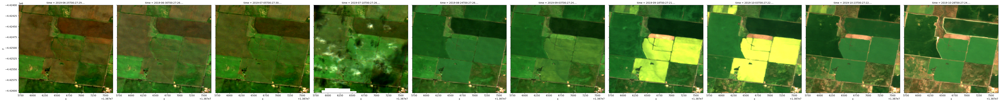

In [17]:
from dea_tools.plotting import display_map, rgb

rgb(ds, bands=['nbart_red', 'nbart_green', 'nbart_blue'], col="time", col_wrap=len(ds.time))


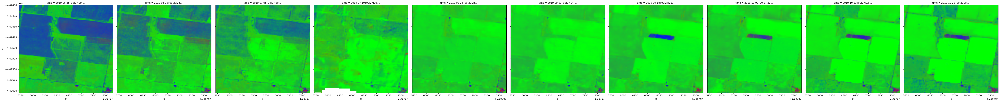

In [18]:
rgb(ds, bands=['bg', 'pv', 'npv'], col="time", col_wrap=len(ds.time))


In [13]:
### openning the file made using the full scrupt:

## Open the satellite data stack
with open(out_dir+stub+'_ds2_tmp.pkl', 'rb') as handle:
    ds = pickle.load(handle)


In [14]:
ds

<xarray.Dataset>
Dimensions:           (time: 10, y: 205, x: 194)
Coordinates:
  * time              (time) datetime64[ns] 2019-06-25T00:27:29.882900 ... 20...
  * y                 (y) float64 -4.424e+06 -4.424e+06 ... -4.426e+06
  * x                 (x) float64 1.388e+07 1.388e+07 ... 1.388e+07 1.388e+07
    spatial_ref       int32 6933
Data variables: (12/16)
    nbart_blue        (time, y, x) float32 221.0 219.0 217.0 ... 584.0 332.0
    nbart_green       (time, y, x) float32 413.0 441.0 428.0 ... 916.0 560.0
    nbart_red         (time, y, x) float32 579.0 558.0 573.0 ... 1.063e+03 614.0
    nbart_red_edge_1  (time, y, x) float32 861.0 861.0 ... 1.267e+03 1.267e+03
    nbart_red_edge_2  (time, y, x) float32 1.298e+03 1.298e+03 ... 2.395e+03
    nbart_red_edge_3  (time, y, x) float32 1.33e+03 1.33e+03 ... 3.118e+03
    ...                ...
    bg                (time, y, x) float64 0.1109 0.09827 ... 0.06867 0.1656
    pv                (time, y, x) float64 0.2864 0.3047 ... 0.6552 0.6725
    npv               (time, y, x) float64 0.6033 0.5981 ... 0.2799 0.1643
    NDVI              (time, y, x) float32 0.4222 0.4361 0.4233 ... 0.5331 0.689
    CFI               (time, y, x) float32 499.8 532.5 513.0 ... 1.232e+03 965.9
    NIRv              (time, y, x) float32 601.6 619.7 ... 1.86e+03 2.297e+03
Attributes:
    crs:           epsg:6933
    grid_mapping:  spatial_ref